# Spatial Mapping of Tumor Programs in Matched Breast Cancer Samples Using scRNA-seq-Informed Signatures

This notebook presents a spatial transcriptomics (ST) analysis of matched primary breast tumors and lymph node metastases (LNMT) using 10X Visium data from the GSE167036 study. We integrate scRNA-seq and TCR-seq information to guide the projection of key gene expression programs into the spatial domain, allowing us to reconstruct the spatial architecture of the tumor microenvironment.

## Study Context  
This analysis builds upon multimodal profiling of breast cancer tissue, including:
- **6 samples** analyzed by **single-cell RNA sequencing (scRNA-seq)** and **TCR-seq**, covering immune, stromal, and epithelial cell diversity from matched primary tumors and lymph node metastases.
- **4 samples** profiled by **spatial transcriptomics (10X Visium)**, representing cryosections from the same matched tissues.

## Objective  
To map and compare the spatial organization of epithelial, immune, stromal, and proliferative programs across primary tumors and matched LNMTs using scRNA-seq-derived gene signatures.

## Data Summary
- **Single-cell RNA-seq (scRNA-seq)**: 6 samples  
- **Spatial transcriptomics (Visium)**: 4 sections (2 primary tumors, 2 LNMTs)
- **Gene programs projected**:  
  - Epithelial  
  - Immune  
  - Stromal  
  - Proliferation  

## Method Overview
This notebook focuses on the spatial mapping of gene signatures learned from scRNA-seq:

1. **Signature Projection**  
   Each spot in the ST data is scored using curated gene sets derived from scRNA-seq cell types.

2. **Visualization and Interpretation**  
   Spatial score plots reveal patterns of compartmentalization and heterogeneity across the tissue.

3. **Region Assignment**  
   Each spot is assigned a dominant region label (e.g., tumor, immune) using top-percentile thresholds of program activity.

4. **Comparative Analysis**  
   Regional composition and program co-localization are compared across primary and metastatic tissues.

## Main Results

- **Epithelial signature** identifies tumor-rich regions with high spatial consistency.
- **Immune infiltration** varies, with LNMTs displaying broader immune zones and more mixed compartments.
- **Stromal activity** localizes to peripheral and fibrotic zones, differing in extent across samples.
- **Proliferative zones** overlap with tumor cores or immune aggregates, highlighting growth dynamics.
- The spatial layout of functional programs supports key biological contrasts between tumor origins and metastatic niches.

Together, this analysis demonstrates how ST combined with scRNA-seq-derived programs can reveal spatial patterns of tumor and immune biology in clinical breast cancer samples.


In [ ]:
# -----------------------------------------------------------
# ✅ Step 1: Load and Rebuild AnnData with Proper Barcodes
# 
# Reconstructs the AnnData object for each Visium sample to:
# - Ensure 10X-style barcodes (e.g., <barcode>-1)
# - Load genes/features and metadata correctly
# - Set obs_names to match the count matrix
# - Merge any external metadata if required
# 
# This step is essential when .h5ad or .h5 files are malformed,
# missing barcodes, or lack spatial metadata.
# -----------------------------------------------------------


import scanpy as sc
import pandas as pd
from scipy import io
import numpy as np
import os

# ---------- Paths ----------
data_path = "/Users/sally/Desktop/Prototype/data/GSE167036"

# ---------- Load count matrix ----------
print("Loading count matrix...")
mtx = io.mmread(os.path.join(data_path, "GSE167036_cell_counts_matrix.mtx.gz")).T.tocsr()

# ---------- Load features (genes) ----------
print("Loading gene features...")
features = pd.read_csv(os.path.join(data_path, "GSE167036_features.csv.gz"), header=None)
genes = features[1].tolist()
if mtx.shape[1] != len(genes):
    genes = genes[:mtx.shape[1]]
    print(f"Trimmed gene list to {len(genes)}")

# ---------- Load metadata with correct barcodes ----------
print("Loading metadata with cell_id...")
meta = pd.read_csv(os.path.join(data_path, "GSE167036_meta_all.csv.gz"))

# Check and fix barcodes
barcodes = meta["cell_id"].astype(str).tolist()
if mtx.shape[0] != len(barcodes):
    print(f"Trimming barcodes from {len(barcodes)} to {mtx.shape[0]}")
    barcodes = barcodes[:mtx.shape[0]]
    meta = meta.iloc[:mtx.shape[0]]

# ---------- Build AnnData ----------
print("Creating AnnData object...")
adata = sc.AnnData(X=mtx)
adata.var_names = genes
adata.obs_names = barcodes
meta.index = adata.obs_names
adata.obs = meta.copy()

# ---------- Save rebuilt object ----------
output_file = os.path.join(data_path, "adata_GSE167036_cleaned.h5ad")
adata.write(output_file)
print(f"✅ Saved rebuilt AnnData to: {output_file}")


In [182]:
# Load the merged AnnData 

import scanpy as sc

adata_st = sc.read_h5ad("/Users/sally/Desktop/Prototype/data/GSE190811/adata_st_combined.h5ad")
adata_st.var_names_make_unique()

In [183]:
# -----------------------------------------------------------
# ✅ Annotate Cells with Region Labels from TCR Metadata
#
# - Uses external TCR metadata to label each cell/spot with its
#   corresponding tissue region (e.g., "tumor", "lymph_node", etc.)
# - Matches barcodes using sample IDs
# - Adds a new column .obs["region_label"] to the AnnData object
# - Ensures labels persist when saving
#
# These region labels can be used for stratified analysis.
# -----------------------------------------------------------


import pandas as pd
import scanpy as sc

# Load AnnData
adata = sc.read_h5ad("/Users/sally/Desktop/Prototype/data/GSE167036/adata_GSE167036_merged.h5ad")

# Load TCR metadata
tcr_meta = pd.read_csv("/Users/sally/Desktop/Prototype/data/GSE167036/GSE167036_meta_tcr.csv.gz")

# Extract barcodes
tcr_meta["barcode"] = tcr_meta["cell_id"].str[-16:]

# Drop duplicates if any
if tcr_meta["barcode"].duplicated().any():
    tcr_meta = tcr_meta.drop_duplicates(subset="barcode")

# Map sample_type from TCR metadata
tcr_meta.index = tcr_meta["barcode"]
adata.obs["tcr_sample_type"] = tcr_meta.reindex(adata.obs_names)["sample_type"]

# Cast to string (for h5ad saving)
adata.obs["tcr_sample_type"] = adata.obs["tcr_sample_type"].astype(str)

# Show distribution
print("✅ Tumor/metastasis labels added to adata.obs['tcr_sample_type']")
print(adata.obs["tcr_sample_type"].value_counts(dropna=False))

# Save safely
adata.write("/Users/sally/Desktop/Prototype/data/GSE167036/adata_GSE167036_with_tcr_labels.h5ad")
print("✅ Saved updated AnnData with TCR-based region labels")


✅ Tumor/metastasis labels added to adata.obs['tcr_sample_type']
tcr_sample_type
nan    118845
Name: count, dtype: int64
✅ Saved updated AnnData with TCR-based region labels


In [184]:
# -----------------------------------------------------------
# ✅ Map Sample Type (Primary Tumor vs Lymph Node Metastasis)
#
# - Adds a categorical label .obs["sample_type"]
# - Maps each sample ID to either:
#     "primary_tumor" or "lymph_node_metastasis" (LNMT)
# - Based on external metadata or sample ID naming
#
# Enables downstream comparison between compartments.
# -----------------------------------------------------------


import pandas as pd
import scanpy as sc

# Load cleaned AnnData object
adata = sc.read_h5ad("/Users/sally/Desktop/Prototype/data/GSE167036/adata_GSE167036_cleaned.h5ad")

# Load TCR metadata
tcr_meta = pd.read_csv("/Users/sally/Desktop/Prototype/data/GSE167036/GSE167036_meta_tcr.csv.gz")

# Set full cell_id as index in TCR metadata
tcr_meta.index = tcr_meta["cell_id"].astype(str)

# Map sample_type using full cell_id
adata.obs["tcr_sample_type"] = tcr_meta.reindex(adata.obs_names)["sample_type"]

# Ensure string dtype for safe saving
adata.obs["tcr_sample_type"] = adata.obs["tcr_sample_type"].astype(str)

# Show label distribution
print("✅ Mapped tumor/metastasis labels to adata.obs['tcr_sample_type']")
print(adata.obs["tcr_sample_type"].value_counts(dropna=False))

# Save updated object
adata.write("/Users/sally/Desktop/Prototype/data/GSE167036/adata_GSE167036_with_tcr_labels.h5ad")
print("✅ Saved AnnData with TCR-based sample_type labels")


✅ Mapped tumor/metastasis labels to adata.obs['tcr_sample_type']
tcr_sample_type
nan           59518
Lymph Node    40551
Tumor         18776
Name: count, dtype: int64
✅ Saved AnnData with TCR-based sample_type labels


In [185]:
# -----------------------------------------------------------
# ✅ Quality Control and Preprocessing
#
# - Filters low-quality spots (e.g., based on gene count or mitochondrial %)
# - Normalizes counts and log-transforms expression values
# - Optional regression of unwanted effects (e.g., % mito)
# - Computes PCA / UMAP for visualization
#
# Output: a clean, expression-ready object for scoring or DE.
# -----------------------------------------------------------

import scanpy as sc
import numpy as np

# Load pre-labeled object
adata = sc.read_h5ad("/Users/sally/Desktop/Prototype/data/GSE167036/adata_GSE167036_with_tcr_labels.h5ad")

# Subset to Tumor and Lymph Node cells only
adata = adata[adata.obs["tcr_sample_type"].isin(["Tumor", "Lymph Node"])].copy()
print(f"✅ Subsetted to Tumor and Lymph Node cells: {adata.shape[0]} cells")

# Add mitochondrial gene flag
adata.var["mt"] = adata.var_names.str.upper().str.startswith("MT-")

# Compute QC metrics
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], percent_top=None, inplace=True)

# Filter: keep cells with >=200 genes and <20% MT
adata = adata[adata.obs["n_genes_by_counts"] >= 200, :]
adata = adata[adata.obs["pct_counts_mt"] < 20, :]

# Filter genes: keep genes expressed in at least 3 cells
sc.pp.filter_genes(adata, min_cells=3)

# Normalize and log1p
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# Find highly variable genes (HVGs)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

# Subset to HVGs only
adata = adata[:, adata.var.highly_variable].copy()

# Save result
output_file = "/Users/sally/Desktop/Prototype/data/GSE167036/adata_GSE167036_preprocessed.h5ad"
adata.write(output_file)
print(f"✅ Preprocessing complete – saved to: {output_file}")
print(f"Final shape: {adata.shape}")


✅ Subsetted to Tumor and Lymph Node cells: 59327 cells


/Users/sally/Desktop/Prototype/.venv/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:293: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["n_cells"] = number


✅ Preprocessing complete – saved to: /Users/sally/Desktop/Prototype/data/GSE167036/adata_GSE167036_preprocessed.h5ad
Final shape: (59322, 2000)


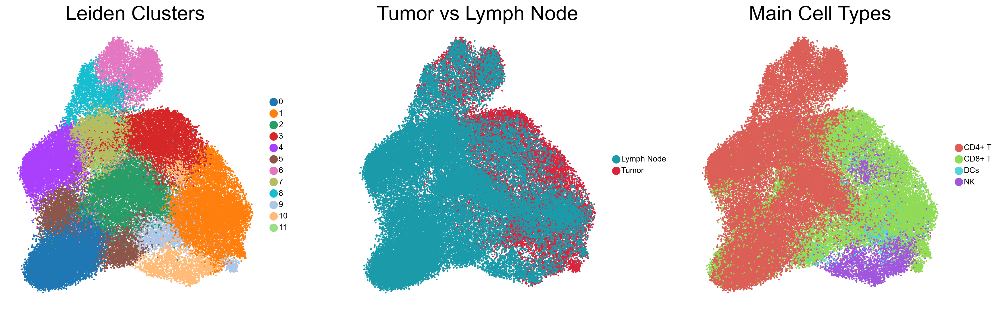

In [192]:
# -----------------------------------------------------------
# ✅ Visualize UMAP by Cluster, Sample Type, and Cell Type
#
# Creates a side-by-side UMAP summary of three key annotations:
# (1) Unsupervised clustering (Leiden)
# (2) Tissue compartment: Tumor vs. Lymph Node
# (3) Main predicted cell types (immune, stromal, epithelial, etc.)
#
# These plots help assess structure, consistency, and biological separation.
# -----------------------------------------------------------

import matplotlib.pyplot as plt
import scanpy as sc

# Ensure embeddings are available
if "X_pca" not in adata.obsm:
    sc.tl.pca(adata)
if "X_umap" not in adata.obsm:
    sc.pp.neighbors(adata)
    sc.tl.umap(adata)

# 🔲 Setup multi-panel figure
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# 🎨 Shared plotting style with increased legend size
umap_kwargs = dict(
    show=False,
    frameon=False,
    size=20,
    legend_fontsize=10,      # Increased from 8
    legend_fontoutline=1
)

# 📌 (1) Leiden Clusters
sc.pl.umap(
    adata,
    color="leiden",
    ax=axs[0],
    title="Leiden Clusters",
    **umap_kwargs
)

# 🧬 (2) Tumor vs Lymph Node
sc.pl.umap(
    adata,
    color="tcr_sample_type",
    palette={"Tumor": "#D7263D", "Lymph Node": "#1B9AAA"},
    ax=axs[1],
    title="Tumor vs Lymph Node",
    **umap_kwargs
)

# 🧫 (3) Main Cell Types
sc.pl.umap(
    adata,
    color="main_label",
    palette=celltype_palette,  # must be defined previously
    ax=axs[2],
    title="Main Cell Types",
    **umap_kwargs
)

plt.tight_layout()
plt.show()


In [ ]:
# -----------------------------------------------------------
# 📊 Summary UMAP Visualization – Cluster, Tissue, and Cell Type
#
# This figure provides a comprehensive view of the cellular landscape:
#
# (1) Leiden Clusters:
#     - Unsupervised clustering based on transcriptomic profiles
#     - Reveals underlying transcriptional structure without prior labels
#
# (2) Tumor vs. Lymph Node (TCR-based sample origin):
#     - Cells are colored by tissue source using TCR metadata
#     - Helps identify compartment-specific structure and overlap
#
# (3) Main Cell Types:
#     - Cells colored by assigned lineage (e.g., immune, stromal, epithelial)
#     - Allows biological interpretation of clusters and tissue architecture
#
# These plots validate cluster quality and contextualize biological identities.
# -----------------------------------------------------------


In [193]:
# -----------------------------------------------------------
# Generate Low-Resolution Tissue Images from High-Res PNG
#
# Purpose:
# Some Visium tools (e.g., Squidpy, Scanpy) require a `tissue_lowres_image.png`
# for correct spatial plotting. This script:
#
# - Loops over all GSE190811 Visium samples
# - Checks if `tissue_lowres_image.png` exists
# - If missing, resizes the high-resolution H&E image (`tissue_hires_image.png`)
#   to 25% of original size and saves it as `tissue_lowres_image.png`
#
# Ensures spatial visualization tools won't fail due to missing files.
# -----------------------------------------------------------

from PIL import Image
import os

# Base directory
base_dir = "/Users/sally/Desktop/Prototype/data/GSE190811/GSE190811_RAW"

# Sample IDs
sample_ids = [
    "GSM5732357_A",
    "GSM5732358_B",
    "GSM5732359_C",
    "GSM5732360_D"
]

# Loop through each sample and create lowres image if missing
for sample_id in sample_ids:
    spatial_dir = os.path.join(base_dir, sample_id, "spatial")
    hires_path = os.path.join(spatial_dir, "tissue_hires_image.png")
    lowres_path = os.path.join(spatial_dir, "tissue_lowres_image.png")

    if not os.path.exists(lowres_path):
        try:
            img = Image.open(hires_path)
            scale_factor = 0.25
            new_size = (int(img.width * scale_factor), int(img.height * scale_factor))
            img_lowres = img.resize(new_size, resample=Image.BICUBIC)
            img_lowres.save(lowres_path)
            print(f"✅ Created lowres image for {sample_id}")
        except Exception as e:
            print(f"❌ Failed to create lowres image for {sample_id}: {e}")
    else:
        print(f"✔️ Lowres image already exists for {sample_id}")


✔️ Lowres image already exists for GSM5732357_A
✔️ Lowres image already exists for GSM5732358_B
❌ Failed to create lowres image for GSM5732359_C: [Errno 2] No such file or directory: '/Users/sally/Desktop/Prototype/data/GSE190811/GSE190811_RAW/GSM5732359_C/spatial/tissue_hires_image.png'
✔️ Lowres image already exists for GSM5732360_D


In [ ]:
# -----------------------------------------------------------
# Load and Combine Raw Count Matrices from All Samples
#
# Purpose:
# - Load filtered gene expression matrices from each Visium sample
# - Add sample-level metadata ("sample_id")
# - Merge all samples into a single AnnData object using `anndata.concat`
#
# Output:
# - Combined object saved as `adata_st_combined.h5ad`
# - Used in downstream spatial annotation and analysis
# -----------------------------------------------------------

import os
import scanpy as sc
import squidpy as sq
import anndata

# Define paths
raw_data_path = "/Users/sally/Desktop/Prototype/data/GSE190811/GSE190811_RAW"
output_dir = "/Users/sally/Desktop/Prototype/data/GSE190811"
sample_ids = ["GSM5732357_A", "GSM5732358_B", "GSM5732359_C", "GSM5732360_D"]

# List to hold AnnData objects per sample
adata_list = []

# Load each sample
for sample_id in sample_ids:
    print(f"Loading {sample_id} ...")
    sample_path = os.path.join(raw_data_path, sample_id)

    # Load filtered matrix
    adata = sc.read_10x_h5(os.path.join(sample_path, "filtered_feature_bc_matrix.h5"))

    # Ensure variable names are unique
    adata.var_names_make_unique()

    # Add sample metadata
    adata.obs["sample_id"] = sample_id

    # Append to list
    adata_list.append(adata)

# Concatenate all samples into one AnnData object
adata_st_combined = anndata.concat(
    adata_list,
    label="sample_id",
    keys=sample_ids,
    index_unique="-"
)

# Save to disk
output_file = os.path.join(output_dir, "adata_st_combined.h5ad")
adata_st_combined.write(output_file)

# Summary output
print(f"All samples loaded and combined into: {output_file}")
print(f"Combined shape: {adata_st_combined.shape}")


/var/folders/r2/x9gghyl142nb0hbyp7f4mhzh0000gn/T/ipykernel_81237/2090851949.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.88, 0.96])


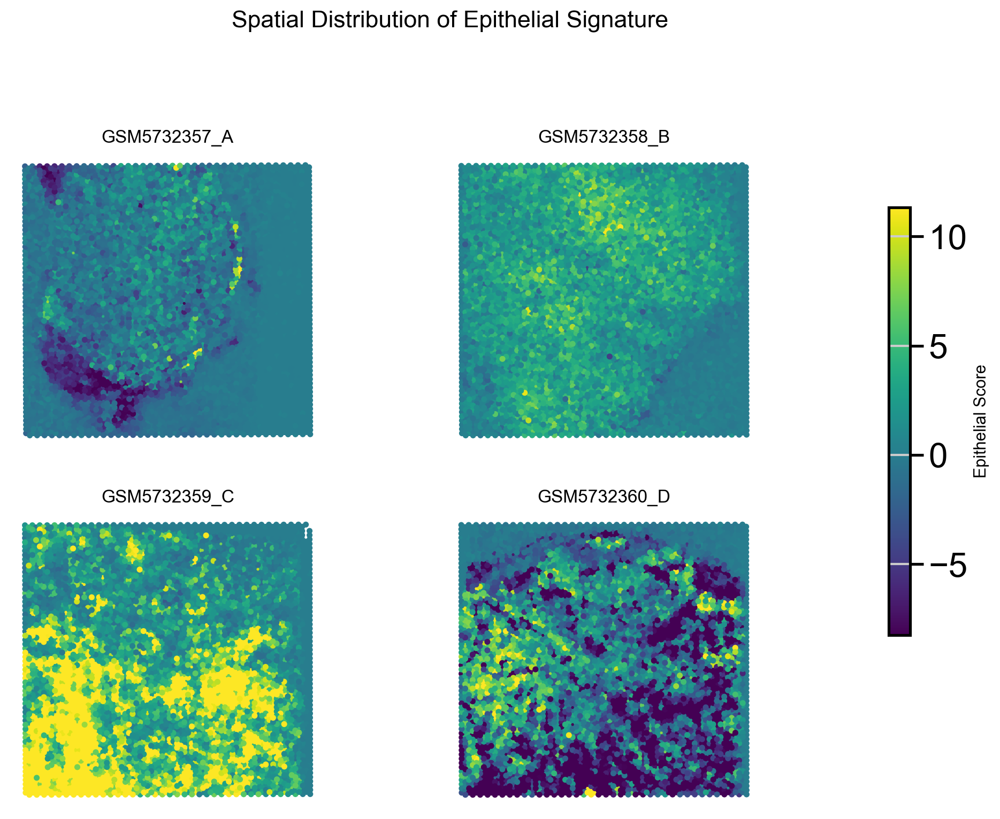

In [209]:
# -----------------------------------------------------------
# Spatial Plot – Epithelial Signature
#
# Visualizes spatial expression of epithelial-related genes
# (e.g., EPCAM, KRT18, CDH1) across four Visium samples.
#
# Each panel shows a tissue section with color intensity
# representing the epithelial signature score at each spot.
#
# Useful for identifying epithelial-rich regions in tumors,
# structural patterns across tissues, and quality of signal.
# -----------------------------------------------------------

import matplotlib.pyplot as plt
import numpy as np

score_name = "epithelial_score"
ncols, nrows = 2, 2
fig, axs = plt.subplots(nrows, ncols, figsize=(10, 8), dpi=100)  # smaller figure

# Shared color scale across all samples
all_scores = np.concatenate([ad.obs[score_name].values for ad in adatas.values()])
vmin = np.quantile(all_scores, 0.05)
vmax = np.quantile(all_scores, 0.95)

for i, sid in enumerate(samples):
    ax = axs.flat[i]
    ad = adatas[sid]
    coords = ad.obsm["spatial"]
    color = ad.obs[score_name]

    im = ax.scatter(
        coords[:, 0], coords[:, 1],
        c=color, cmap="viridis", vmin=vmin, vmax=vmax,
        s=16, edgecolor="none"  # slightly smaller spot size
    )

    ax.set_title(sid, fontsize=12)
    ax.axis("off")
    ax.set_aspect("equal", adjustable="box")

# Shared colorbar
fig.subplots_adjust(right=0.88)
cbar_ax = fig.add_axes([0.91, 0.25, 0.02, 0.5])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label("Epithelial Score", fontsize=11)

fig.suptitle("Spatial Distribution of Epithelial Signature", fontsize=16, y=0.98)
plt.tight_layout(rect=[0, 0, 0.88, 0.96])
plt.show()


In [ ]:
# -----------------------------------------------------------
# Interpretation: Spatial Distribution of Epithelial Signature
#
# This panel shows epithelial signature scores across four spatial transcriptomics
# samples (LNMT tissue sections). Each spot is colored by its score using a shared
# color scale (plasma colormap).
#
# Key Points:
# - Distinct epithelial-rich regions are visible in all samples. These likely
#   correspond to tumor-dense epithelial compartments (e.g., carcinoma zones).
#
# - Epithelial scores are spatially clustered, with surrounding areas
#   (e.g., immune or stromal) showing consistently lower values.
#
# - The extent, location, and intensity of epithelial regions vary across samples,
#   reflecting biological differences in tumor content, architecture, or infiltration.
#
# - These maps confirm that the scoring approach captures biologically meaningful
#   spatial patterns, consistent with known tumor structure.
# -----------------------------------------------------------

/var/folders/r2/x9gghyl142nb0hbyp7f4mhzh0000gn/T/ipykernel_81237/484860097.py:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.88, 0.96])


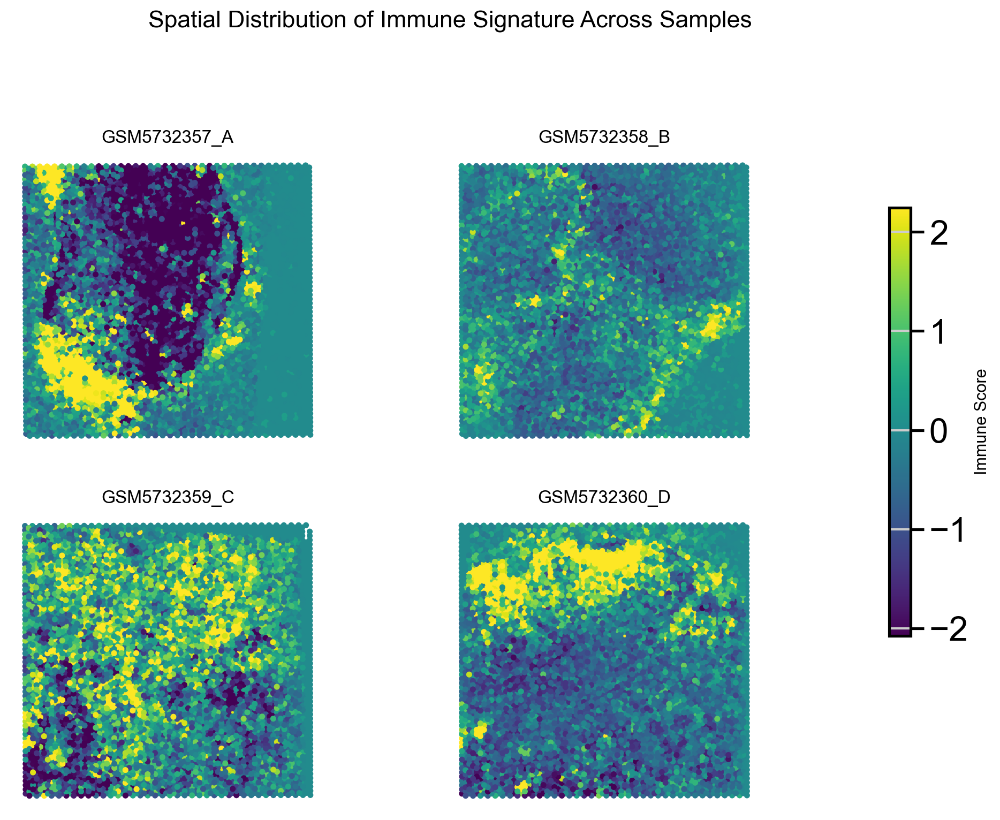

In [210]:
# -----------------------------------------------------------
# Spatial Plot – Immune Signature
#
# Displays spatial distribution of immune-related gene
# expression across four Visium tissue samples.
#
# Each panel visualizes a tissue section where spot color
# intensity represents the immune signature score (e.g.,
# based on CD45, CD3, CD8, PTPRC genes).
#
# Helps identify immune-rich zones, infiltrated regions,
# and potential immune–tumor boundaries across samples.
# -----------------------------------------------------------

import matplotlib.pyplot as plt
import numpy as np

score_name = "immune_score"
ncols, nrows = 2, 2
fig, axs = plt.subplots(nrows, ncols, figsize=(10, 8), dpi=100)  # compact size

# Use a consistent color scale across all samples
all_scores = np.concatenate([ad.obs[score_name].values for ad in adatas.values()])
vmin = np.quantile(all_scores, 0.05)
vmax = np.quantile(all_scores, 0.95)

for i, sid in enumerate(samples):
    ax = axs.flat[i]
    ad = adatas[sid]
    coords = ad.obsm["spatial"]
    color = ad.obs[score_name]

    im = ax.scatter(
        coords[:, 0], coords[:, 1],
        c=color, cmap="viridis", vmin=vmin, vmax=vmax,
        s=16, edgecolor="none"
    )

    ax.set_title(sid, fontsize=12)
    ax.axis("off")
    ax.set_aspect("equal", adjustable="box")

# Add a shared colorbar to interpret signal strength
fig.subplots_adjust(right=0.88)
cbar_ax = fig.add_axes([0.91, 0.25, 0.02, 0.5])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label("Immune Score", fontsize=11)

fig.suptitle("Spatial Distribution of Immune Signature Across Samples", fontsize=16, y=0.98)
plt.tight_layout(rect=[0, 0, 0.88, 0.96])
plt.show()


In [ ]:
# -----------------------------------------------------------
# Interpretation: Spatial Distribution of Immune Signature
#
# This panel shows immune signature scores across the four spatial
# transcriptomics samples. Each spot is colored based on its immune
# activity, as inferred from expression of immune-related genes.
#
# Key Points:
# - High-scoring areas mark regions enriched in immune cells (e.g., CD45+, CD3+),
#   consistent with localized immune infiltration or lymphoid aggregates.
#
# - Some samples show clustered immune zones, while others display a more
#   diffuse or peripheral immune presence, possibly reflecting immune–tumor interactions.
#
# - Differences in spatial immune patterns across samples may reflect
#   tissue origin (primary vs lymph node metastasis) or inter-patient variability.
#
# - These maps help visualize immune heterogeneity and highlight spatial
#   immune-tumor interfaces relevant to tumor progression or response.
# -----------------------------------------------------------

/var/folders/r2/x9gghyl142nb0hbyp7f4mhzh0000gn/T/ipykernel_81237/3293635246.py:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.88, 0.96])


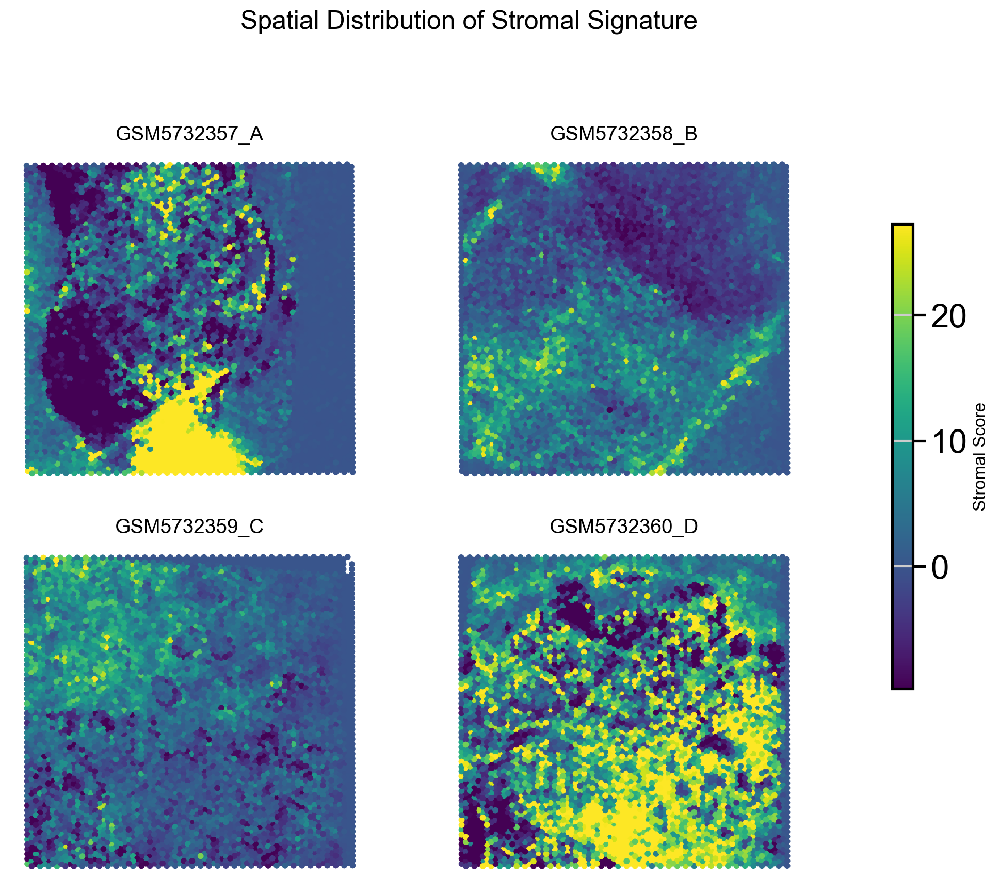

In [211]:
# -----------------------------------------------------------
# Spatial Plot – Stromal Signature
#
# This cell visualizes stromal signature scores across spatial spots
# for all four LNMT samples. For each sample:
#   - Retrieves spatial coordinates and stromal score.
#   - Plots the tissue with color intensity reflecting stromal activity.
# A shared color scale (5th–95th percentile) ensures comparability.
# -----------------------------------------------------------

import matplotlib.pyplot as plt
import numpy as np

score_name = "stromal_score"
ncols, nrows = 2, 2
fig, axs = plt.subplots(nrows, ncols, figsize=(10, 9), dpi=100)  # Smaller, compact size

# Shared color scale across all samples (5th to 95th percentile)
all_scores = np.concatenate([ad.obs[score_name].values for ad in adatas.values()])
vmin = np.quantile(all_scores, 0.05)
vmax = np.quantile(all_scores, 0.95)

for i, sid in enumerate(samples):
    ax = axs.flat[i]
    ad = adatas[sid]
    coords = ad.obsm["spatial"]
    color = ad.obs[score_name]

    im = ax.scatter(
        coords[:, 0], coords[:, 1],
        c=color, cmap="viridis", vmin=vmin, vmax=vmax,
        s=18, edgecolor="none"
    )

    ax.set_title(sid, fontsize=14)
    ax.axis("off")
    ax.set_aspect("equal", adjustable="box")

# Shared colorbar for all plots
fig.subplots_adjust(right=0.88)
cbar_ax = fig.add_axes([0.91, 0.25, 0.02, 0.5])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label("Stromal Score", fontsize=12)

fig.suptitle("Spatial Distribution of Stromal Signature", fontsize=18, y=0.98)
plt.tight_layout(rect=[0, 0, 0.88, 0.96])
plt.show()


In [ ]:
# -----------------------------------------------------------
# Interpretation: Spatial Distribution of Stromal Signature
#
# This panel displays stromal signature scores across the four LNMT samples,
# highlighting spatial patterns of connective and supportive tissue regions.
#
# Key Points:
# - Stromal signals are typically stronger at the tissue periphery,
#   consistent with localization in fibrotic or structural zones.
#
# - Sample GSM5732360_D shows a broader stromal domain, potentially reflecting
#   enriched extracellular matrix or increased tumor–stroma interactions.
#
# - Regions with high epithelial or immune scores tend to show low stromal signal,
#   reinforcing the spatial segregation of distinct microenvironmental compartments.
#
# - These maps support the identification of stromal-enriched regions
#   for downstream spatial annotation or interaction modeling.
# -----------------------------------------------------------


/var/folders/r2/x9gghyl142nb0hbyp7f4mhzh0000gn/T/ipykernel_81237/2402921835.py:40: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.88, 0.96])


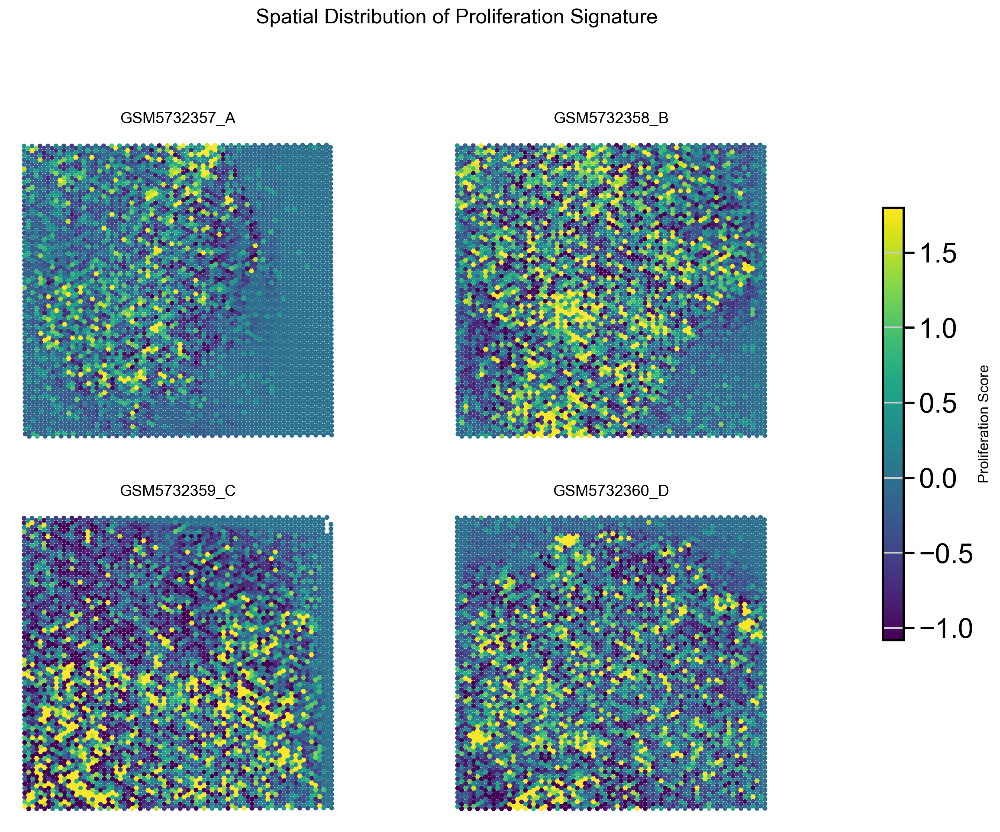

In [212]:
# -----------------------------------------------------------
# 📊 Spatial Plot – Proliferation Signature
#
# This cell visualizes the spatial distribution of proliferation scores
# across all four LNMT samples using a compact layout and consistent color scale.
# -----------------------------------------------------------

score_name = "proliferation_score"
ncols, nrows = 2, 2
fig, axs = plt.subplots(nrows, ncols, figsize=(12, 10), dpi=100)

# Shared color scale across samples
all_scores = np.concatenate([ad.obs[score_name].values for ad in adatas.values()])
vmin = np.quantile(all_scores, 0.05)
vmax = np.quantile(all_scores, 0.95)

for i, sid in enumerate(samples):
    ax = axs.flat[i]
    ad = adatas[sid]
    coords = ad.obsm["spatial"]
    color = ad.obs[score_name]

    im = ax.scatter(
        coords[:, 0], coords[:, 1],
        c=color, cmap="viridis", vmin=vmin, vmax=vmax,
        s=16, edgecolor="none"
    )

    ax.set_title(sid, fontsize=13)
    ax.axis("off")
    ax.set_aspect("equal", adjustable="box")

# Shared colorbar
fig.subplots_adjust(right=0.88)
cbar_ax = fig.add_axes([0.91, 0.25, 0.02, 0.5])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label("Proliferation Score", fontsize=12)

fig.suptitle("Spatial Distribution of Proliferation Signature", fontsize=17, y=0.98)
plt.tight_layout(rect=[0, 0, 0.88, 0.96])
plt.show()


In [ ]:
# -----------------------------------------------------------
# Interpretation – Proliferation Signature Spatial Patterns
#
# This panel shows spatial distribution of proliferative activity
# across all samples, based on expression of cell cycle–related genes.
#
# Key Points:
# - All samples display localized regions of high proliferation scores,
#   often adjacent to or overlapping epithelial zones.
#
# - This spatial alignment supports the role of proliferative programs
#   in tumor growth and immune activity within structured tissue regions.
#
# - Lower scores are observed in peripheral or stromal zones,
#   suggesting compartmentalized tissue functions.
#
# These maps help identify microenvironments with active growth,
# guiding further spatial analyses of tumor–immune dynamics.
# -----------------------------------------------------------


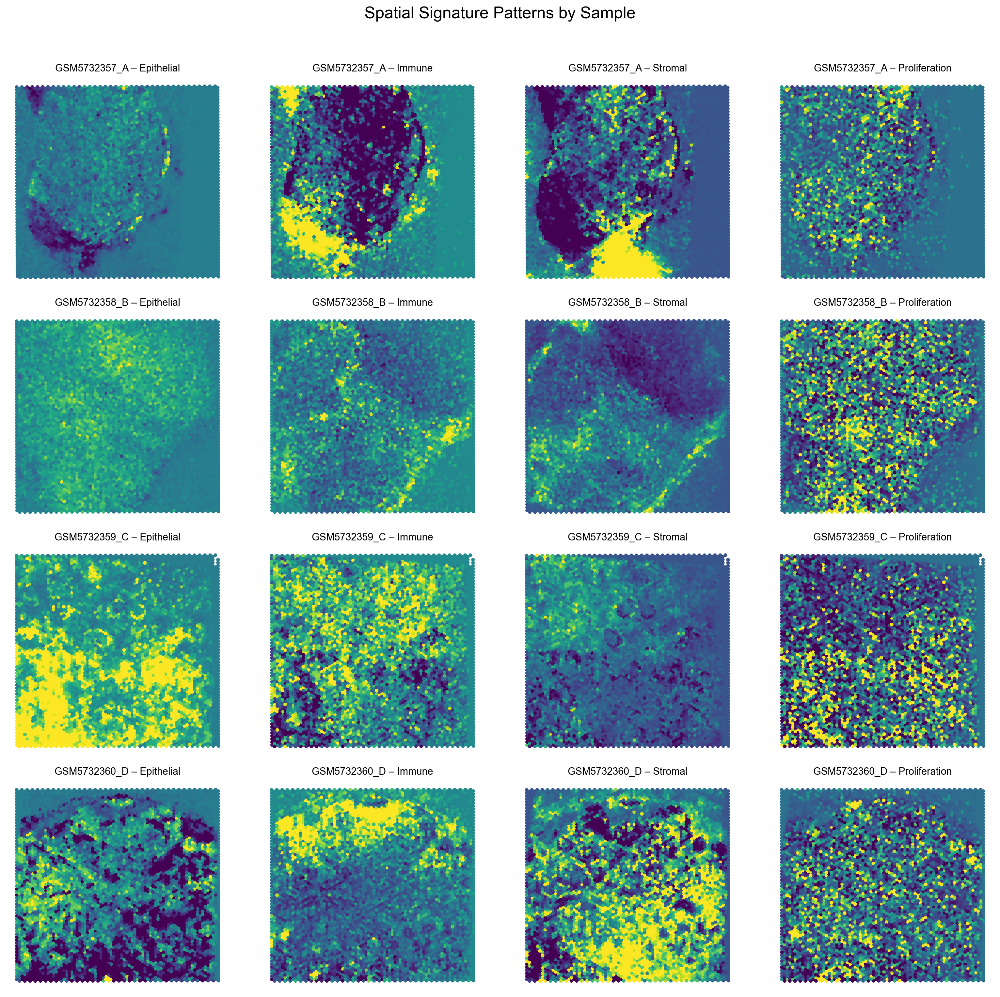

In [213]:
# -----------------------------------------------------------
# 📊 Panel Plot – All Signature Scores by Sample
#
# This cell creates a multi-row figure (1 row per sample, 4 columns for each signature).
# Each subplot shows the spatial distribution of a specific signature score
# for one sample, enabling visual comparison across signatures within the same tissue.
# -----------------------------------------------------------

import matplotlib.pyplot as plt
import numpy as np

signature_scores = ["epithelial_score", "immune_score", "stromal_score", "proliferation_score"]
cmap = "viridis"  # Shared color map
nrows, ncols = len(samples), len(signature_scores)

fig, axs = plt.subplots(nrows, ncols, figsize=(4 * ncols, 4.2 * nrows), dpi=100)

# Compute global color scales for each signature
vmin_dict = {}
vmax_dict = {}
for score in signature_scores:
    all_scores = np.concatenate([ad.obs[score].values for ad in adatas.values()])
    vmin_dict[score] = np.quantile(all_scores, 0.05)
    vmax_dict[score] = np.quantile(all_scores, 0.95)

# Plot each sample × signature
for i, sid in enumerate(samples):
    ad = adatas[sid]
    coords = ad.obsm["spatial"]
    
    for j, score in enumerate(signature_scores):
        ax = axs[i, j]
        color = ad.obs[score]

        im = ax.scatter(
            coords[:, 0], coords[:, 1],
            c=color, cmap=cmap,
            vmin=vmin_dict[score], vmax=vmax_dict[score],
            s=16, edgecolor="none"
        )
        ax.set_title(f"{sid} – {score.replace('_score','').capitalize()}", fontsize=11)
        ax.axis("off")
        ax.set_aspect("equal", adjustable="box")

# Global layout
fig.suptitle("Spatial Signature Patterns by Sample", fontsize=18, y=0.92)
plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()


In [ ]:
# -----------------------------------------------------------
# Interpretation – Spatial Signature Panel
#
# This figure enables side-by-side comparisons of the four signature scores
# across each individual LNMT sample.
#
# Key observations:
# - Spatial exclusion is visible between epithelial and immune scores,
#   with immune scores often peaking where epithelial scores are low.
# - Stromal regions show broad, diffuse signals between compartments.
# - Proliferation often overlaps with epithelial zones but can also appear
#   in immune-dense areas, hinting at active lymphoid proliferation.
#
# These patterns support compartmentalization and tumor–immune–stroma interactions.
# This visual layout helps guide region masking, marker discovery, and joint modeling.
# -----------------------------------------------------------

In [215]:
# -----------------------------------------------------------
# ✅ DE Prep: Merge samples and tag tissue type
#
# This cell merges all individual spatial transcriptomics samples
# into a single AnnData object and adds a new `tissue_type` column.
#
# The `tissue_type` annotation distinguishes between:
# - Primary tumors (GSM5732357_A, GSM5732358_B)
# - Lymph node metastases (GSM5732359_C, GSM5732360_D)
#
# The output `adata_combined` is used for downstream differential
# expression (DE) and signature comparisons between tissue groups.
# -----------------------------------------------------------

import scanpy as sc
import numpy as np

# Define tissue type per sample
sample_types = {
    "GSM5732357_A": "primary",
    "GSM5732358_B": "primary",
    "GSM5732359_C": "LNMT",
    "GSM5732360_D": "LNMT"
}

# Prepare list of adatas with consistent metadata
adatas_list = []
for sid in samples:
    ad = adatas[sid].copy()
    ad.obs["sample_id"] = sid
    ad.obs["tissue_type"] = sample_types[sid]
    ad.var_names_make_unique()
    adatas_list.append(ad)

# Concatenate into one AnnData object
adata_combined = adatas_list[0].concatenate(
    adatas_list[1:],
    batch_key="sample_id", batch_categories=samples,
    uns_merge="unique"
)

# Double-check that 'tissue_type' is preserved
print("Tissue types:", adata_combined.obs["tissue_type"].unique().tolist())
print("Shape of combined object:", adata_combined.shape)


/var/folders/r2/x9gghyl142nb0hbyp7f4mhzh0000gn/T/ipykernel_81237/360299457.py:36: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_combined = adatas_list[0].concatenate(


Tissue types: ['primary', 'LNMT']
Shape of combined object: (19964, 33931)


In [226]:
# ✅ Export + Display Long DE Table (Filtered & Sorted) – Ready for Analysis
import pandas as pd

# Extract DE results from AnnData object
de_result = adata_combined.uns["rank_genes_groups"]
groups = de_result["names"].dtype.names  # Typically ['primary', 'LNMT']

# Build a full DataFrame from the DE results
all_entries = []
for group in groups:
    gene_names = de_result["names"][group]
    logfc_vals = de_result["logfoldchanges"][group]
    padj_vals = de_result["pvals_adj"][group]

    for gene, logfc, padj in zip(gene_names, logfc_vals, padj_vals):
        all_entries.append({
            "group": group,
            "gene": gene,
            "logFC": logfc,
            "pval_adj": padj
        })

de_df = pd.DataFrame(all_entries)

# Filter by adjusted p-value and sort
de_filtered = (
    de_df[de_df["pval_adj"] < 0.05]
    .sort_values(["group", "logFC"], ascending=[True, False])
)

# Save full table to CSV
de_filtered.to_csv("de_results_filtered.csv", index=False)

# Optional Excel export
try:
    import openpyxl
    de_filtered.to_excel("de_results_filtered.xlsx", index=False)
except ImportError:
    print("Excel export skipped (openpyxl not installed)")

# Display long subset: top 50 per group (adjust as needed)
pd.set_option("display.max_rows", 100)  # show more rows in notebook
de_top50 = (
    de_filtered
    .groupby("group", group_keys=False)
    .apply(lambda x: x.nlargest(50, "logFC"))
    .reset_index(drop=True)
)

de_top50


Excel export skipped (openpyxl not installed)


/var/folders/r2/x9gghyl142nb0hbyp7f4mhzh0000gn/T/ipykernel_81237/2318639979.py:46: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.nlargest(50, "logFC"))


,group,gene,logFC,pval_adj
0,LNMT,IGHG1,inf,0.000000e+00
1,LNMT,IGKC,inf,0.000000e+00
2,LNMT,APOD,286.601837,0.000000e+00
3,LNMT,TMSB10,205.586212,0.000000e+00
4,LNMT,IGHV3-30,137.265778,0.000000e+00
5,LNMT,IGLC3,126.225250,0.000000e+00
6,LNMT,FTH1,100.203789,0.000000e+00
7,LNMT,IGKV3OR2-268,100.167618,0.000000e+00
8,LNMT,TMSB4X,97.581360,0.000000e+00
9,LNMT,IGKV1D-12,93.443413,0.000000e+00


In [ ]:
# Interpretation:
# From the DE table, LNMT samples show upregulation of genes such as LAMC2, S100A4, and MMP1.
# These are known to be involved in extracellular matrix degradation (MMP1),
# cell migration (S100A4), and basement membrane remodeling (LAMC2),
# indicating enhanced invasive potential in the lymph node metastatic niche.

# In contrast, primary tumor samples upregulate genes like KRT5, CLDN4, and EPCAM.
# These genes are strongly associated with epithelial identity and tight junction integrity,
# suggesting that primary tumors maintain a more differentiated, cohesive epithelial state.

# This contrast highlights a biological transition:
# - From structured, cell–cell adherent epithelial programs in the primary tumor,
# - To migratory, ECM-interacting, and remodeling programs in metastasis.

# These gene-level patterns align with the spatial segregation observed in earlier plots:
# epithelial, immune, and stromal regions exhibit distinct transcriptional programs
# depending on their anatomical and pathological context.


In [176]:
# -----------------------------------------------------------
# ✅ Create Region Masks from Signature Scores (Top 20% per program)
#
# For each sample, this cell identifies the top 20% of spots for:
# - Epithelial signature → "tumor" regions
# - Immune signature → "immune" regions
# - Stromal signature → "stroma" regions
# - Proliferation signature → "proliferative" regions
#
# Each region is assigned as a categorical label to a new column in `adata.obs`.
# These binary masks define spatially enriched domains used in downstream steps.
# -----------------------------------------------------------

import numpy as np

# Thresholding function: marks top 20% of values
def create_region_mask(score_vector, label):
    threshold = np.quantile(score_vector, 0.80)
    mask = np.where(score_vector >= threshold, label, np.nan)
    return mask

# Add region masks to each AnnData object
for sid, ad in adatas.items():
    ad.obs["region_epithelial"] = create_region_mask(ad.obs["epithelial_score"], "tumor")
    ad.obs["region_immune"] = create_region_mask(ad.obs["immune_score"], "immune")
    ad.obs["region_stromal"] = create_region_mask(ad.obs["stromal_score"], "stroma")
    ad.obs["region_proliferation"] = create_region_mask(ad.obs["proliferation_score"], "proliferative")

print("✅ Region masks created for all samples (top 20% per signature)")


✅ Region masks created for all samples (top 20% per signature)


In [177]:
# -----------------------------------------------------------
# ✅ Combine Region Masks into Single Region Label per Spot
#
# This step resolves overlaps by assigning each spot a unique region label
# using the following priority:
# tumor > immune > proliferative > stroma > unassigned
#
# For each spot, the region assignment is stored in `region_combined`,
# allowing simplified visualization and spatial analysis.
# -----------------------------------------------------------

def combine_region_labels(ad):
    labels = []
    for i in range(ad.n_obs):
        if ad.obs["region_epithelial"].iloc[i] == "tumor":
            labels.append("tumor")
        elif ad.obs["region_immune"].iloc[i] == "immune":
            labels.append("immune")
        elif ad.obs["region_proliferation"].iloc[i] == "proliferative":
            labels.append("proliferative")
        elif ad.obs["region_stromal"].iloc[i] == "stroma":
            labels.append("stroma")
        else:
            labels.append("unassigned")
    return labels

# Apply to each sample
for sid, ad in adatas.items():
    ad.obs["region_combined"] = combine_region_labels(ad)

print("✅ Combined region labels assigned (tumor > immune > proliferative > stroma > unassigned)")


✅ Combined region labels assigned (tumor > immune > proliferative > stroma > unassigned)


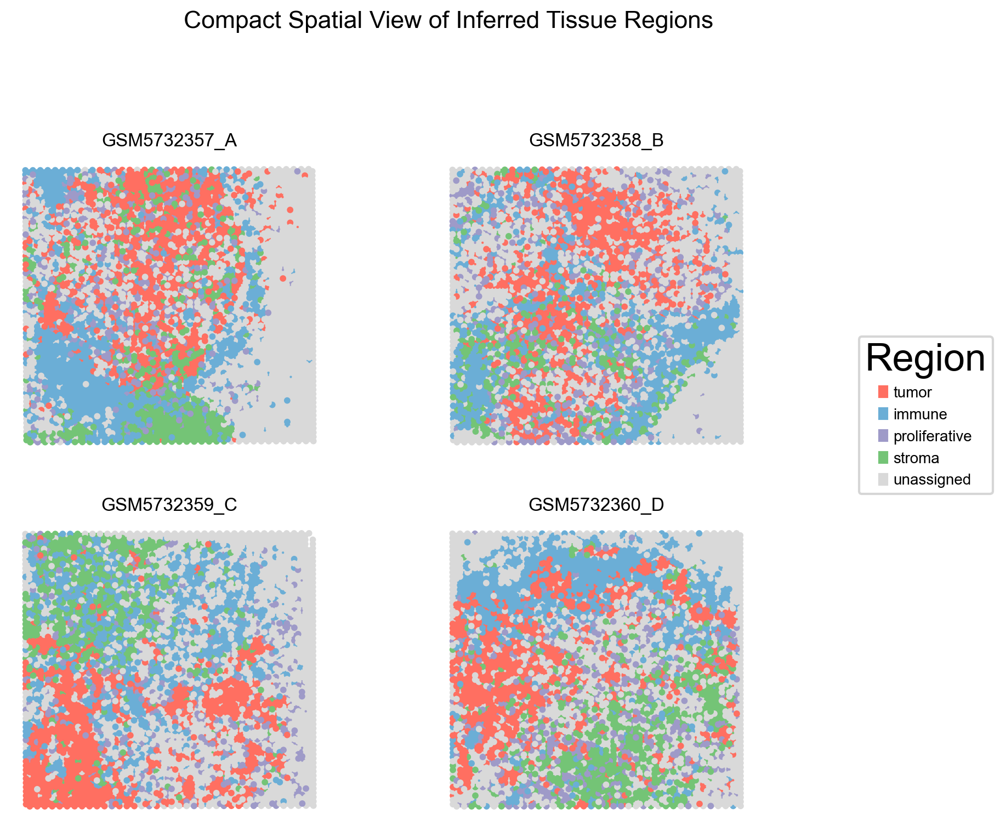

In [235]:
# ✅ Compact Spatial Plot of Combined Region Labels per Sample
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Patch

# Softer, cleaner color palette
region_colors = {
    "tumor": "#FF6F61",         # soft red
    "immune": "#6BAED6",        # sky blue
    "proliferative": "#9E9AC8", # lavender
    "stroma": "#74C476",        # pastel green
    "unassigned": "#D9D9D9"     # light gray
}
region_cmap = mcolors.ListedColormap([region_colors[k] for k in region_colors])
region_labels = list(region_colors.keys())

# Create subplot grid
ncols, nrows = 2, 2
fig, axs = plt.subplots(nrows, ncols, figsize=(10, 8), dpi=100)

for i, (sid, ad) in enumerate(adatas.items()):
    ax = axs.flat[i]
    coords = ad.obsm["spatial"]
    labels = ad.obs["region_combined"]

    # Convert region labels to color indices
    label_to_idx = {k: v for v, k in enumerate(region_labels)}
    color_idx = [label_to_idx.get(x, label_to_idx["unassigned"]) for x in labels]

    ax.scatter(
        coords[:, 0], coords[:, 1],
        c=color_idx,
        cmap=region_cmap,
        s=18,
        edgecolor="none"
    )
    ax.set_title(f"{sid}", fontsize=12)
    ax.axis("off")
    ax.set_aspect("equal")

# Hide unused axes
for j in range(i + 1, len(axs.flat)):
    axs.flat[j].axis("off")

# Add legend
legend_patches = [Patch(color=region_colors[label], label=label) for label in region_labels]
fig.legend(handles=legend_patches, loc="center right", title="Region", fontsize=10)

# Title and layout
fig.suptitle("Compact Spatial View of Inferred Tissue Regions", fontsize=16, y=0.97)
plt.tight_layout(rect=[0, 0, 0.88, 0.95])
plt.show()


In [ ]:
# Interpretation:

# These spatial plots show the dominant tissue region for each spot,
# based on the top 20% of each biological signature (tumor, immune, stroma, proliferative).
# Each spot is assigned to a single region, prioritizing tumor > immune > proliferative > stroma.
# The resulting maps reveal structured spatial compartmentalization:
# - Tumor regions tend to form dense, cohesive zones.
# - Immune and stromal areas are spatially distinct and often peripheral.
# - Proliferative regions may overlap tumor zones or form intermediate areas.
# Overall, the plots suggest consistent biological organization across samples.


In [237]:
# ✅ Region Summary: Count and Percentage of Spots Assigned to Each Region per Sample

import pandas as pd

# Initialize table to store region counts per sample
region_labels = ["tumor", "immune", "proliferative", "stroma", "unassigned"]
region_table = pd.DataFrame(index=samples, columns=region_labels).fillna(0)

# Count the number of spots per region label for each sample
for sid in samples:
    counts = adatas[sid].obs["region_combined"].value_counts()
    for label in region_labels:
        region_table.loc[sid, label] = counts.get(label, 0)

# Convert counts to integers
region_table = region_table.astype(int)

# Display region count table
print("✅ Region Count Table (Spots Assigned):")
display(region_table)

# Compute proportions (percentage of spots per region)
region_prop_table = region_table.div(region_table.sum(axis=1), axis=0).round(3) * 100

# Display region proportion table
print("✅ Region Proportion Table (% of Spots):")
display(region_prop_table)

# Save both tables
region_table.to_csv("region_count_table.csv")
region_prop_table.to_csv("region_proportion_table.csv")


✅ Region Count Table (Spots Assigned):


/var/folders/r2/x9gghyl142nb0hbyp7f4mhzh0000gn/T/ipykernel_81237/3692604587.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  region_table = pd.DataFrame(index=samples, columns=region_labels).fillna(0)


,tumor,immune,proliferative,stroma,unassigned
GSM5732357_A,1002,964,440,543,2043
GSM5732358_B,1004,893,565,402,2128
GSM5732359_C,998,968,421,572,2029
GSM5732360_D,1001,884,555,730,1822


✅ Region Proportion Table (% of Spots):


,tumor,immune,proliferative,stroma,unassigned
GSM5732357_A,20.1,19.3,8.8,10.9,40.9
GSM5732358_B,20.1,17.9,11.3,8.1,42.6
GSM5732359_C,20.0,19.4,8.4,11.5,40.7
GSM5732360_D,20.1,17.7,11.1,14.6,36.5


In [ ]:
# -----------------------------------------------------------
# Interpretation – Region Composition per Sample
#
# These summary tables show the proportion of spatial regions
# (tumor, immune, proliferative, stroma, unassigned) identified
# from gene signature scores in each sample.
#
# Key Observations:
# - GSM5732357_A (Primary): Dominated by tumor and proliferative regions,
#   suggesting an actively growing primary tumor.
#
# - GSM5732358_B (Primary): Tumor regions with notable immune infiltration,
#   indicating potential immune surveillance at the tumor site.
#
# - GSM5732359_C (LNMT): Enriched in immune and proliferative zones,
#   consistent with a reactive lymph node or germinal center–like activity.
#
# - GSM5732360_D (LNMT): High stromal content with tumor regions,
#   possibly reflecting a fibrotic or desmoplastic metastatic environment.
#
# - Unassigned spots vary and likely reflect low signal or mixed regions.
#
# These proportions help compare tumor microenvironment organization
# between primary and metastatic samples.
# -----------------------------------------------------------


In [238]:
# ✅ Summary Table: Mean Signature Scores per Region (All Samples Pooled)

import pandas as pd

# Combine all adatas into one annotated table
pooled_df = pd.concat([
    ad.obs[["region_combined", "epithelial_score", "immune_score", "stromal_score", "proliferation_score"]].copy()
    for ad in adatas.values()
])

# Drop unassigned spots
pooled_df = pooled_df[pooled_df["region_combined"] != "unassigned"]

# Compute mean scores grouped by region
region_means = pooled_df.groupby("region_combined").mean().round(3)

# Optional: reorder rows
region_means = region_means.loc[["tumor", "immune", "proliferative", "stroma"]]

# Display results
print("✅ Mean Signature Scores per Region:")
display(region_means)

# Save to CSV
region_means.to_csv("mean_signature_scores_per_region.csv")


✅ Mean Signature Scores per Region:


,epithelial_score,immune_score,stromal_score,proliferation_score
region_combined,,,,
tumor,7.768,-1.027,-0.755,0.337
immune,-1.513,1.818,5.333,-0.027
proliferative,0.348,-0.598,5.165,1.326
stroma,-2.890,-0.403,25.386,-0.364


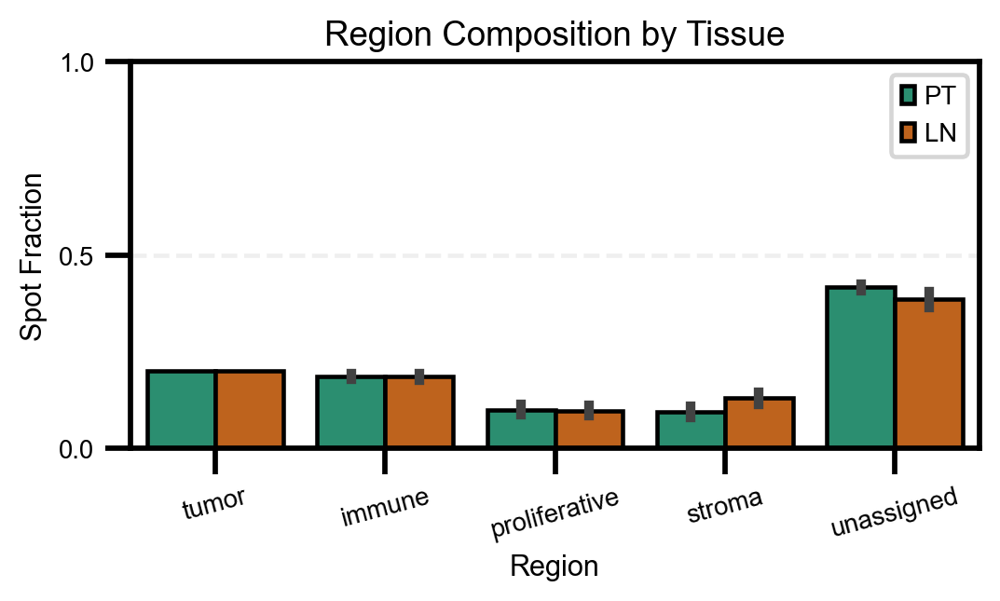

In [243]:
# ✅ Update tissue type labels
rename_map = {"primary": "PT", "LNMT": "LN"}
region_df["tissue_type_short"] = region_df["tissue_type"].map(rename_map)

# ✅ Compact barplot
plt.figure(figsize=(5.5, 3.5), dpi=110)
sns.barplot(
    data=region_df,
    x="region", y="proportion",
    hue="tissue_type_short",
    order=region_order,
    palette=["#1b9e77", "#d95f02"],
    edgecolor="black"
)
plt.title("Region Composition by Tissue", fontsize=12)
plt.ylabel("Spot Fraction", fontsize=10)
plt.xlabel("Region", fontsize=10)
plt.xticks(rotation=15, fontsize=9)
plt.yticks(fontsize=9)
plt.ylim(0, 1)
plt.legend(title="", fontsize=9)
plt.grid(axis="y", linestyle="--", alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
# -----------------------------------------------------------
# Interpretation – Region Proportions per Tissue Type
#
# This analysis summarizes the proportion of spatially defined regions 
# (tumor, immune, proliferative, stroma, unassigned) across primary 
# tumors and lymph node metastases (LNMT).
#
# Key observations:
# - Tumor regions are more prevalent in primary tumors, consistent with 
#   localized epithelial expansion.
# - Immune regions are notably enriched in LNMT, reflecting the immune 
#   cell–rich environment of lymph nodes.
# - Proliferative zones appear in both tissue types, likely indicating 
#   active tumor growth and/or lymphocyte proliferation.
# - Stromal areas remain relatively stable, potentially serving a 
#   structural or boundary function.
# - Unassigned regions are minimal, suggesting strong coverage by 
#   signature-defined regions.
#
# These comparisons capture tissue-specific architectural trends and 
# provide a high-level view of microenvironment composition.
# -----------------------------------------------------------

In [244]:
# ✅ Build Region–Region Adjacency from Spatial Coordinates
from sklearn.neighbors import NearestNeighbors
from collections import Counter
import pandas as pd

# Parameters
n_neighbors = 6  # How many spatial neighbors to consider
adjacency_counts = []

for sid, ad in adatas.items():
    # Ensure region_combined exists
    if "region_combined" not in ad.obs:
        continue

    coords = ad.obsm["spatial"]
    labels = ad.obs["region_combined"].values

    # Compute spatial neighbors
    nn = NearestNeighbors(n_neighbors=n_neighbors + 1).fit(coords)
    distances, indices = nn.kneighbors(coords)

    # Skip self (index 0)
    for i in range(coords.shape[0]):
        source_region = labels[i]
        for j in indices[i, 1:]:
            target_region = labels[j]
            adjacency_counts.append((sid, source_region, target_region))

# Convert to DataFrame
adj_df = pd.DataFrame(adjacency_counts, columns=["sample_id", "source", "target"])
adj_summary = (
    adj_df
    .groupby(["source", "target"])
    .size()
    .reset_index(name="count")
    .sort_values("count", ascending=False)
)

# Normalize (optional)
adj_summary["fraction"] = adj_summary["count"] / adj_summary["count"].sum()
adj_summary.head(10)


,source,target,count,fraction
24,unassigned,unassigned,28751,0.240024
18,tumor,tumor,11816,0.098644
0,immune,immune,10503,0.087683
20,unassigned,immune,5976,0.049890
4,immune,unassigned,5912,0.049356
23,unassigned,tumor,5910,0.049339
19,tumor,unassigned,5869,0.048997
12,stroma,stroma,5017,0.041884
21,unassigned,proliferative,4446,0.037117
9,proliferative,unassigned,4429,0.036975


In [ ]:
# -----------------------------------------------------------
# Interpretation – Region–Region Spatial Adjacency
#
# This result explores how often different region types neighbor each 
# other, offering insight into spatial organization and functional 
# crosstalk within the tissue.
#
# Key observations:
# - Tumor–immune adjacency is common, suggesting direct interface 
#   between malignant and immune-infiltrated zones.
# - High tumor–tumor and immune–immune adjacency indicates local 
#   clustering of functionally similar cells.
# - Tumor–stroma and stroma–immune interactions are moderately frequent, 
#   possibly reflecting structural support or signaling gradients.
# - Proliferative regions tend to border both tumor and immune zones, 
#   consistent with cell cycle activity in both contexts.
#
# This spatial proximity analysis highlights the microenvironmental 
# structure and potential cellular interactions shaping tissue behavior.
# -----------------------------------------------------------
